# Movies Data / Visualization

In [11]:
import plotly.express as px
import pandas as pd
import numpy as np

In [43]:
pd.set_option('display.max_columns', None)

In [12]:
df = pd.read_parquet("../data/movies-clean.parquet.gzip")
df.head()

,RATING,VOTES,RunTime,TYPE,Year_From,Year_To,Genre_Action,Genre_Adventure,Genre_Animation,Genre_Biography,...,Director_Àlex Pastor,Director_Álex de la Iglesia,Director_Álvaro Brechner,Director_Álvaro Fernández Armero,Director_Álvaro Longoria,Director_Ángel Gómez Hernández,Director_Ángeles Reiné,Director_Åke Sandgren,Director_Óscar Pedraza,Director_Ömer Ugur
0,6.1,21062,121.0,Movie,2021,2021,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,5.0,17870,25.0,Series,2021,2021,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,8.2,885805,44.0,Series,2010,2022,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9.2,414849,23.0,Series,2013,2013,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5,7.6,25858,50.0,Series,2020,2020,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Visualization

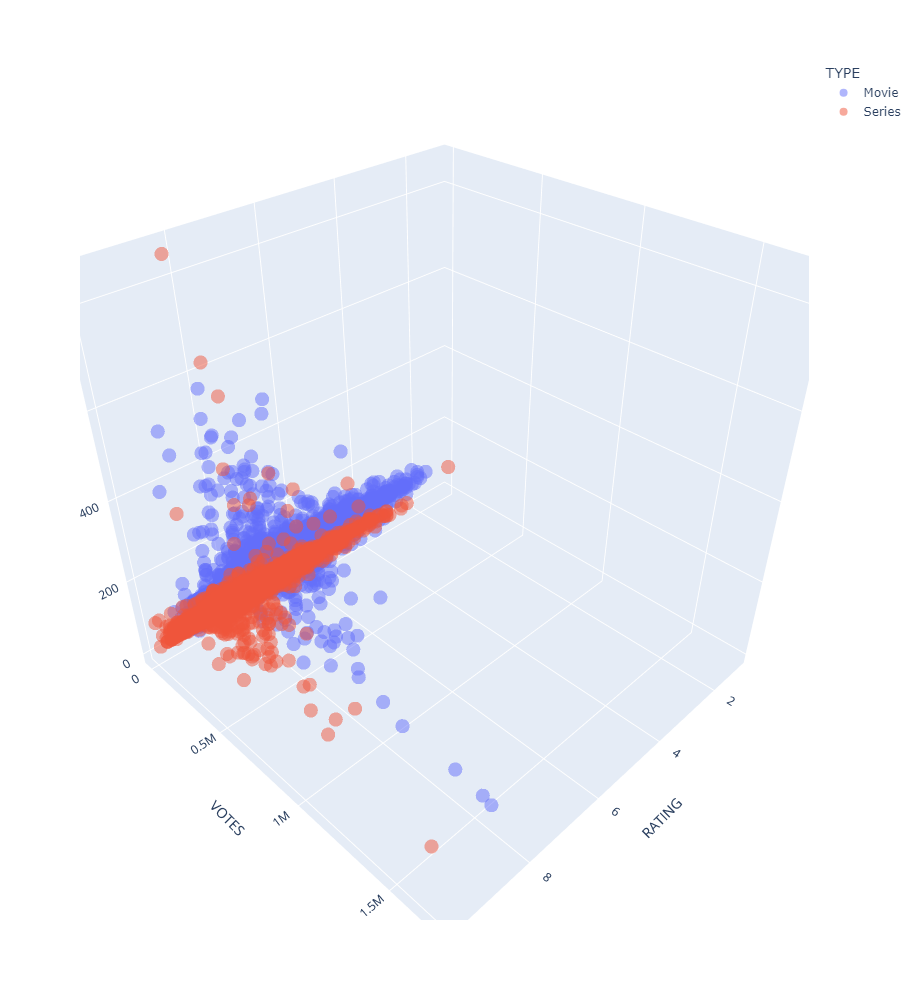

In [13]:
fig = px.scatter_3d(df,
                    x="RATING",
                    y="VOTES",
                    z="RunTime",
                    color="TYPE",
                    opacity=0.5,
                    height=1000)
fig.show()

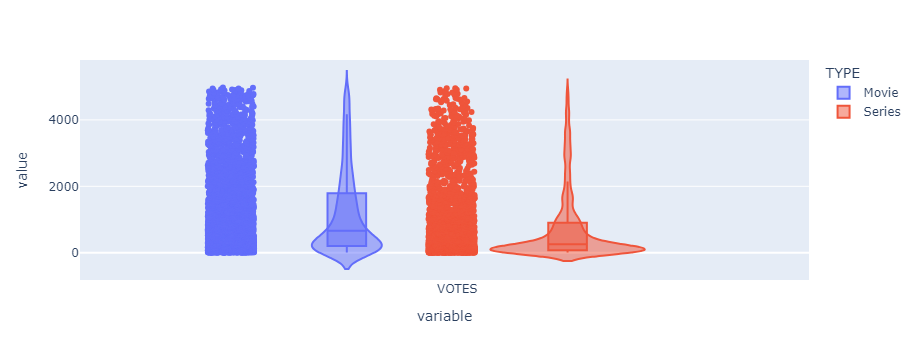

In [19]:
fig = px.violin(df[df["VOTES"] < 5_000], y=['VOTES'],
                color="TYPE",
                points='all', box=True)
fig.show()

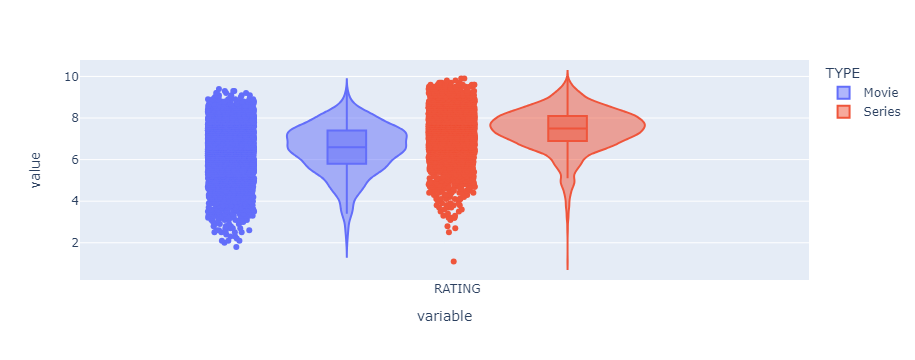

In [15]:
fig = px.violin(df, y=['RATING'],
                color="TYPE",
                points='all', box=True)
fig.show()

In [26]:
df_test = df[(df["Actor_Brad Pitt"] == 1) |
             (df["Actor_Angelina Jolie"] == 1) |
             (df["Actor_Jennifer Aniston"] == 1)]
df_test

,RATING,VOTES,RunTime,TYPE,Year_From,Year_To,Genre_Action,Genre_Adventure,Genre_Animation,Genre_Biography,...,Director_Àlex Pastor,Director_Álex de la Iglesia,Director_Álvaro Brechner,Director_Álvaro Fernández Armero,Director_Álvaro Longoria,Director_Ángel Gómez Hernández,Director_Ángeles Reiné,Director_Åke Sandgren,Director_Óscar Pedraza,Director_Ömer Ugur
21,8.9,880918,22.0,Series,1994,2004,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
300,7.6,386263,133.0,Movie,2011,2011,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
465,7.1,141657,95.0,Movie,2016,2016,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
483,6.0,110725,97.0,Movie,2019,2019,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
615,6.0,230565,103.0,Movie,2010,2010,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
916,6.6,30553,110.0,Movie,2018,2018,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
963,5.9,72433,105.0,Movie,2016,2016,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
994,6.2,62161,111.0,Movie,1997,1997,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1045,6.0,43574,122.0,Movie,2017,2017,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2512,7.2,703,134.0,Movie,2020,2020,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


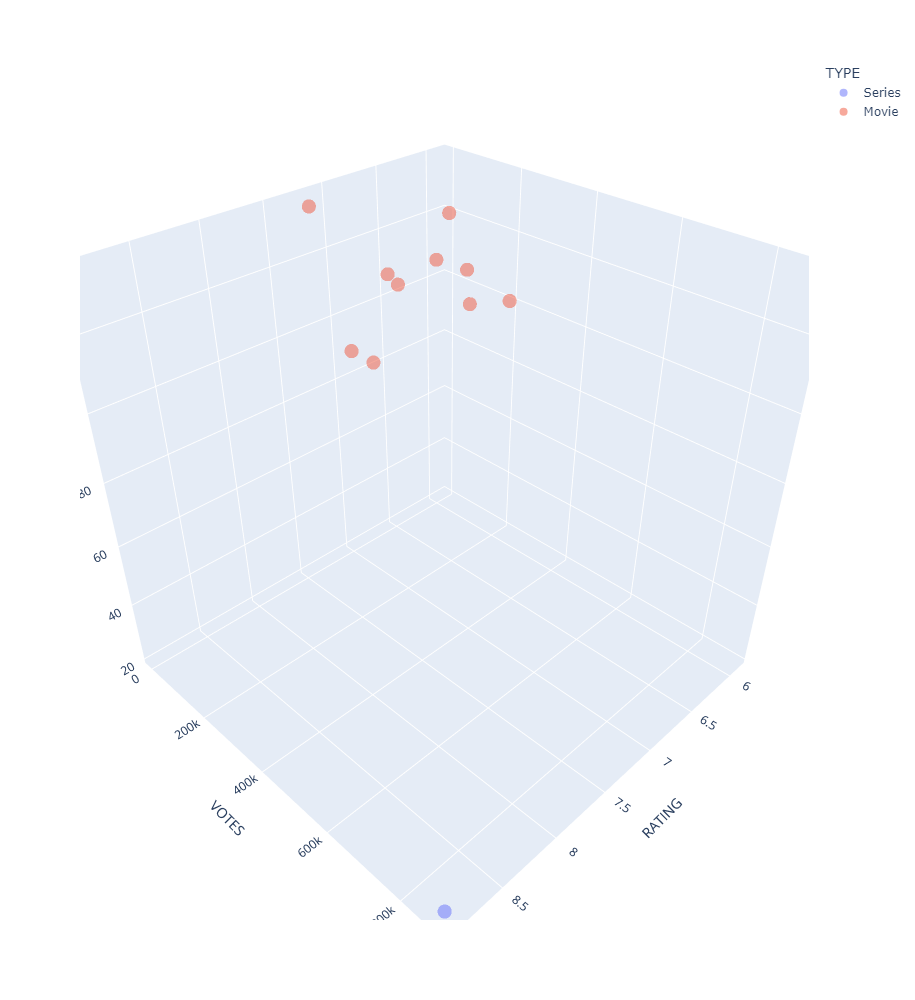

In [27]:
fig = px.scatter_3d(df_test,
                    x="RATING",
                    y="VOTES",
                    z="RunTime",
                    color="TYPE",
                    opacity=0.5,
                    height=1000)
fig.show()

## Finding Genres with highest rating

In [29]:
columns = df.columns.tolist()
genres = [i for i in columns if i.startswith('Genre_')]
genres

['Genre_Action',
 'Genre_Adventure',
 'Genre_Animation',
 'Genre_Biography',
 'Genre_Comedy',
 'Genre_Crime',
 'Genre_Documentary',
 'Genre_Drama',
 'Genre_Family',
 'Genre_Fantasy',
 'Genre_Film-Noir',
 'Genre_Game-Show',
 'Genre_History',
 'Genre_Horror',
 'Genre_Music',
 'Genre_Musical',
 'Genre_Mystery',
 'Genre_News',
 'Genre_Reality-TV',
 'Genre_Romance',
 'Genre_Sci-Fi',
 'Genre_Short',
 'Genre_Sport',
 'Genre_Talk-Show',
 'Genre_Thriller',
 'Genre_War',
 'Genre_Western']

In [37]:
genre_rating = {}
for genre in genres:
    ratings = df[df[genre] == 1]["RATING"]
    genre_rating[genre] = ratings
    
df_genres = pd.DataFrame.from_dict(genre_rating)
df_genres.head()

,Genre_Action,Genre_Adventure,Genre_Animation,Genre_Biography,Genre_Comedy,Genre_Crime,Genre_Documentary,Genre_Drama,Genre_Family,Genre_Fantasy,...,Genre_News,Genre_Reality-TV,Genre_Romance,Genre_Sci-Fi,Genre_Short,Genre_Sport,Genre_Talk-Show,Genre_Thriller,Genre_War,Genre_Western
0,6.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.1,NaN,NaN
1,5.0,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.2,NaN,NaN
3,NaN,9.2,9.2,NaN,9.2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,7.6,NaN,NaN,NaN,NaN,7.6,NaN,7.6,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


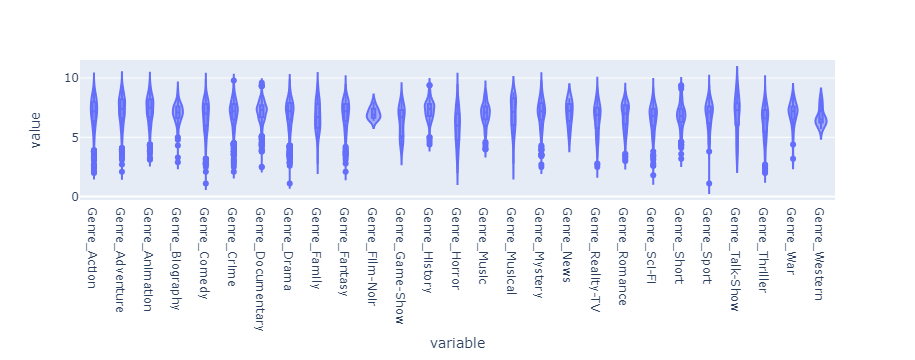

In [38]:
fig = px.violin(df_genres, y=df_genres.columns,
                box=True)
fig.show()

In [44]:
df_genres.describe()

,Genre_Action,Genre_Adventure,Genre_Animation,Genre_Biography,Genre_Comedy,Genre_Crime,Genre_Documentary,Genre_Drama,Genre_Family,Genre_Fantasy,Genre_Film-Noir,Genre_Game-Show,Genre_History,Genre_Horror,Genre_Music,Genre_Musical,Genre_Mystery,Genre_News,Genre_Reality-TV,Genre_Romance,Genre_Sci-Fi,Genre_Short,Genre_Sport,Genre_Talk-Show,Genre_Thriller,Genre_War,Genre_Western
count,1844.000000,1337.000000,1405.000000,268.000000,2419.000000,1377.000000,1137.000000,3507.000000,371.000000,456.000000,12.000000,96.000000,256.000000,441.000000,183.000000,52.000000,737.000000,18.000000,348.000000,764.000000,270.000000,180.000000,160.000000,23.00000,777.000000,45.000000,20.000000
mean,7.097451,7.298504,7.379929,7.054104,6.825589,7.080320,7.174406,7.093413,6.774933,6.999123,7.016667,6.369792,7.326172,5.860998,6.981421,7.001923,7.089417,7.061111,6.626437,6.802094,6.582593,6.772778,6.852500,6.96087,6.333719,6.986667,6.720000
std,1.285180,1.211768,1.113301,0.846153,1.236879,1.119748,0.871702,1.111281,1.262962,1.196625,0.478318,1.248841,0.825179,1.496229,0.967087,1.334238,1.166562,0.991220,1.270726,1.115221,1.220957,1.142761,1.221451,1.63672,1.331206,1.063784,0.759917
min,2.000000,2.100000,3.100000,2.900000,1.100000,2.100000,2.500000,1.100000,2.800000,2.100000,6.400000,3.800000,4.400000,2.000000,4.000000,2.800000,2.500000,5.000000,2.500000,3.000000,1.800000,3.200000,1.100000,3.60000,2.000000,3.200000,5.700000
25%,6.400000,6.600000,6.700000,6.600000,6.000000,6.500000,6.700000,6.500000,5.800000,6.400000,6.675000,5.100000,6.800000,4.800000,6.500000,6.075000,6.500000,6.450000,5.800000,6.100000,6.000000,6.300000,6.200000,6.10000,5.500000,6.500000,6.275000
50%,7.200000,7.400000,7.500000,7.100000,7.000000,7.200000,7.300000,7.200000,6.700000,7.200000,6.900000,6.700000,7.400000,6.000000,7.100000,7.150000,7.200000,7.250000,6.900000,7.000000,6.800000,6.800000,7.150000,7.30000,6.600000,7.200000,6.500000
75%,8.000000,8.200000,8.200000,7.600000,7.800000,7.800000,7.700000,7.900000,7.800000,7.800000,7.400000,7.300000,7.800000,7.000000,7.600000,8.300000,7.900000,7.800000,7.500000,7.700000,7.400000,7.400000,7.600000,7.85000,7.300000,7.600000,7.050000
max,9.900000,9.900000,9.900000,9.100000,9.900000,9.800000,9.600000,9.900000,9.600000,9.500000,8.000000,8.500000,9.400000,9.500000,9.100000,8.800000,9.800000,8.300000,9.200000,8.900000,9.200000,9.400000,9.400000,9.40000,9.400000,8.700000,8.300000
